In [10]:
import torch
import numpy as np
import os,sys
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
from sklearn.metrics import classification_report
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision 



In [11]:

train_on_gpu = False
# define the CNN architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # convolutional layer
        self.conv1 = nn.Conv2d(3, 16, 5)
        # max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, 5)
        self.dropout = nn.Dropout(0.2)
        self.fc1 = nn.Linear(32*53*53, 256)
        self.fc2 = nn.Linear(256, 84)
        self.fc3 = nn.Linear(84, 2)
        self.softmax = nn.LogSoftmax(dim=1)

        
    def forward(self, x):
        # add sequence of convolutional and max pooling layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.dropout(x)
        x = x.view(-1, 32 * 53 * 53)
        x = F.relu(self.fc1(x))
        x = self.dropout(F.relu(self.fc2(x)))
        x = self.softmax(self.fc3(x))
        return x

In [4]:


  

#     # plot the images in the batch, along with the corresponding labels
#     fig = plt.figure(figsize=(10, 4))
#     # display 20 images
#     for idx in np.arange(10):
#         ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
#         imshow(images[idx])
#         ax.set_title(classes[labels[idx]])

In [17]:
def main():

    # how many samples per batch to load
    batch_size = 32
    # percentage of training set to use as validation
    test_size = 0.3
    valid_size = 0.1

    transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor()
        ])

    projectDir = os.getcwd()

    dataDir = os.path.join(projectDir,"data")



    data = datasets.ImageFolder(dataDir,transform=transform)


    #For test
    num_data = len(data)
    indices_data = list(range(num_data))
    np.random.shuffle(indices_data)
    split_tt = int(np.floor(test_size * num_data))
    train_idx, test_idx = indices_data[split_tt:], indices_data[:split_tt]

    #For Valid
    num_train = len(train_idx)
    indices_train = list(range(num_train))
    np.random.shuffle(indices_train)
    split_tv = int(np.floor(valid_size * num_train))
    train_new_idx, valid_idx = indices_train[split_tv:],indices_train[:split_tv]


    # define samplers for obtaining training and validation batches
    train_sampler = SubsetRandomSampler(train_new_idx)
    test_sampler = SubsetRandomSampler(test_idx)
    valid_sampler = SubsetRandomSampler(valid_idx)
    train_loader = torch.utils.data.DataLoader(data, batch_size=batch_size,
        sampler=train_sampler, num_workers=1)
    valid_loader = torch.utils.data.DataLoader(data, batch_size=batch_size, 
        sampler=valid_sampler, num_workers=1)
    test_loader = torch.utils.data.DataLoader(data, sampler = test_sampler, batch_size=batch_size, 
        num_workers=1)
    classes = ['typing','noTyping']

    len(test_loader)*batch_size + len(valid_loader)*batch_size + len(train_loader)*batch_size
    
    
    for batch in valid_loader:
        print(batch[0].size())

    import matplotlib.pyplot as plt
    %matplotlib inline

    # helper function to un-normalize and display an image
    def imshow(img):
        img = img / 2 + 0.5  # unnormalize
        plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image

    # obtain one batch of training images
    dataiter = iter(train_loader)
    images, labels = dataiter.next()
    images = images.numpy() # convert images to numpy for display
    
    
    
    # create a complete CNN
    model = Net()
    # print(model)

    # move tensors to GPU if CUDA is available
    if train_on_gpu:
        model.cuda()
    
     # specify loss function
    criterion = torch.nn.CrossEntropyLoss()

    # specify optimizer
    optimizer = torch.optim.SGD(model.parameters(), lr = 0.003, momentum= 0.9)
    
    # number of epochs to train the model
    n_epochs = 5 # you may increase this number to train a final model

    valid_loss_min = np.Inf # track change in validation loss

    for epoch in range(1, n_epochs+1):

        # keep track of training and validation loss
        train_loss = 0.0
        valid_loss = 0.0

        ###################
        # train the model #
        ###################
        model.train()
        for data, target in train_loader:
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss
            train_loss += loss.item()*data.size(0)

        ######################    
        # validate the model #
        ######################
        model.eval()
        for data, target in valid_loader:
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # update average validation loss 
            valid_loss += loss.item()*data.size(0)

        # calculate average losses
        train_loss = train_loss/len(train_loader.dataset)
        valid_loss = valid_loss/len(valid_loader.dataset)

        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, train_loss, valid_loss))

        # save model if validation loss has decreased
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_loss_min,
            valid_loss))
            torch.save(model.state_dict(), 'model_cifar.pt')
            valid_loss_min = valid_loss

    # def imshowNew(img):
    #   ''' function to show image '''
    #   img = img / 2 + 0.5 # unnormalize
    #   npimg = img.numpy() # convert to numpy objects
    #   plt.imshow(np.transpose(npimg, (1, 2, 0)))
    #   plt.show()


    # track test loss
    test_loss = 0.0
    class_correct = list(0. for i in range(2))
    class_total = list(0. for i in range(2))

    pred_list = []
    true_list = []
    model.eval()
    i=1
    # iterate over test data
    len(test_loader)
    # print(len(test_loader))
    for data, target in test_loader:
        i=i+1
        if len(target)!=batch_size:
            continue
    #     print(len(target))


    #     imshowNew(torchvision.utils.make_grid(data))
    #     print('GroundTruth: ', ' '.join('%s' % classes[target[j]] for j in range(32)))


        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # update test loss 
        test_loss += loss.item()*data.size(0)
        # convert output probabilities to predicted class
        _, pred = torch.max(output, 1)    

        images = data.numpy() # convert images to numpy for display
        
        pred_list.append(pred.cpu().numpy())
        true_list.append(target.cpu().numpy())

        # plot the images in the batch, along with the corresponding labels
        fig = plt.figure(figsize=(15, 10))
        for idx in np.arange(32):
            ax = fig.add_subplot(8, 32/8, idx+1, xticks=[], yticks=[])
            imshow(images[idx])
            ax.set_title(classes[target[idx]]+"-"+classes[pred[idx]])



    #     print('Predicted: ', ' '.join('%s' % classes[pred[j]] for j in range(32)))

        # compare predictions to true label
        correct_tensor = pred.eq(target.data.view_as(pred))
        correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
        # calculate test accuracy for each object class
    #     print(target)

        for i in range(batch_size):       
            label = target.data[i]
            class_correct[label] += correct[i].item()
            class_total[label] += 1
            
    pred_list = [i[0] for i in pred_list]
    true_list = [i[0] for i in true_list]
    print(classification_report(true_list, pred_list))
    # average test loss
    test_loss = test_loss/len(test_loader.dataset)
    print('Test Loss: {:.6f}\n'.format(test_loss))

    for i in range(2):
        if class_total[i] > 0:
            print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
                classes[i], 100 * class_correct[i] / class_total[i],
                np.sum(class_correct[i]), np.sum(class_total[i])))
        else:
            print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

    print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
        100. * np.sum(class_correct) / np.sum(class_total),
        np.sum(class_correct), np.sum(class_total)))
    

torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([20, 3, 224, 224])
Epoch: 1 	Training Loss: 0.199181 	Validation Loss: 0.000076
Validation loss decreased (inf --> 0.000076).  Saving model ...
Epoch: 2 	Training Loss: 0.001566 	Validation Loss: 0.000011
Validation loss decreased (0.000076 --> 0.000011).  Saving model

<ipython-input-17-52e35e8a2925>:199: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  ax = fig.add_subplot(8, 32/8, idx+1, xticks=[], yticks=[])
<ipython-input-17-52e35e8a2925>:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(15, 10))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        64
           1       1.00      1.00      1.00        41

    accuracy                           1.00       105
   macro avg       1.00      1.00      1.00       105
weighted avg       1.00      1.00      1.00       105

Test Loss: 0.000023

Test Accuracy of typing: 100% (1679/1679)
Test Accuracy of noTyping: 100% (1681/1681)

Test Accuracy (Overall): 100% (3360/3360)


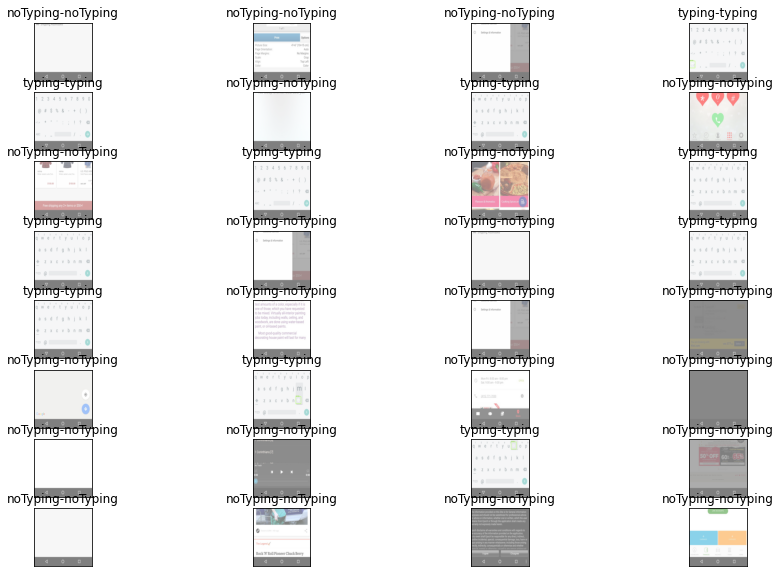

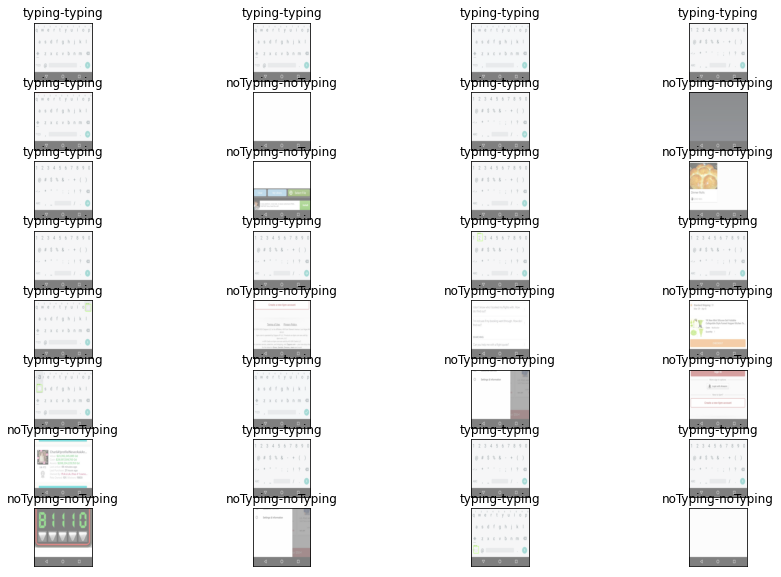

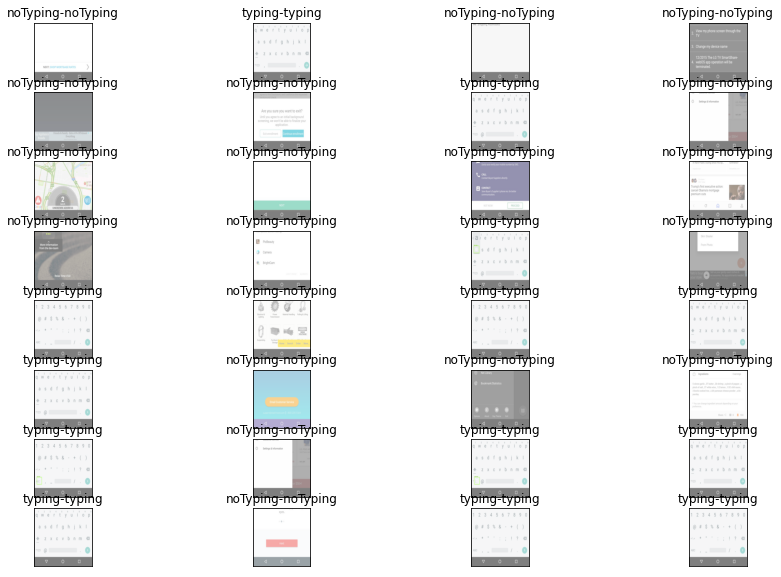

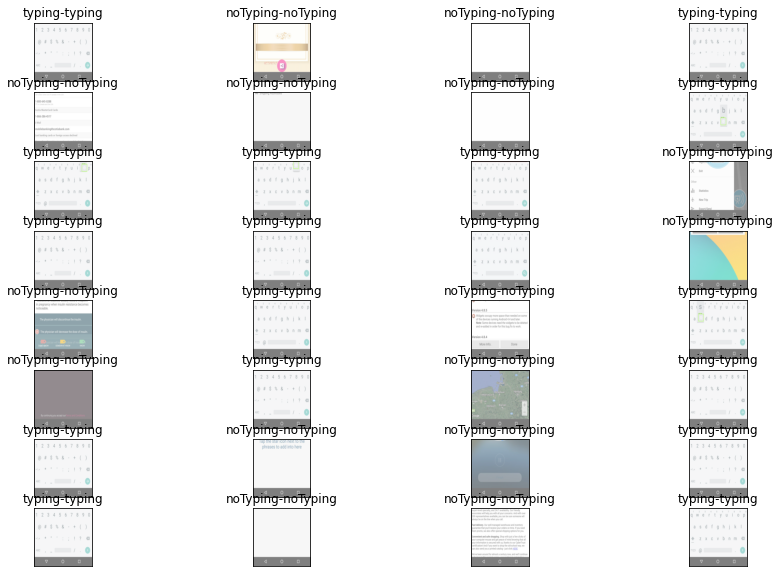

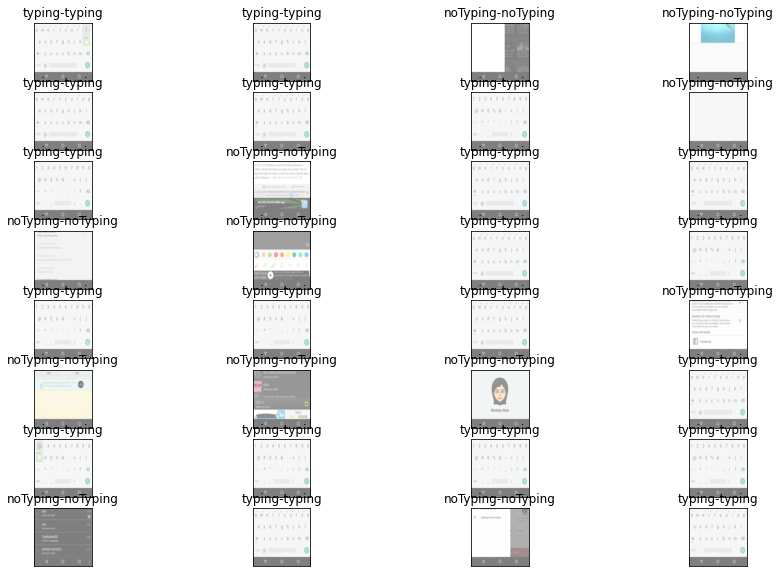

...

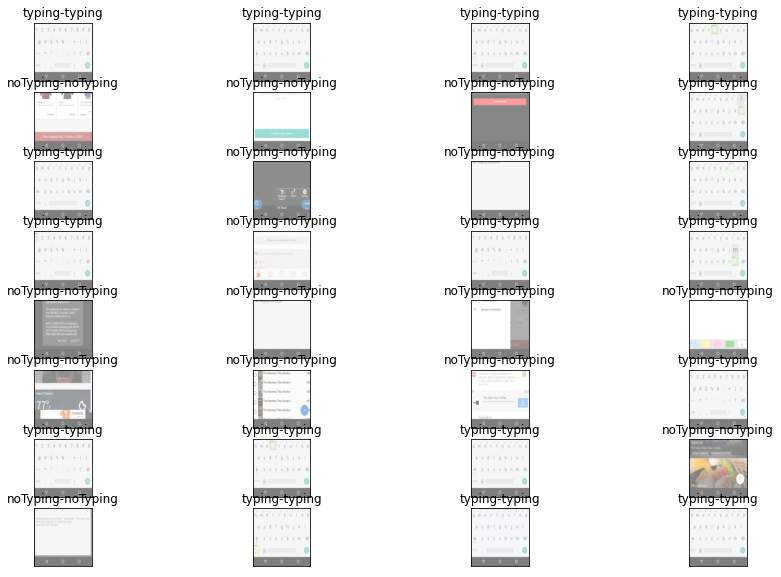

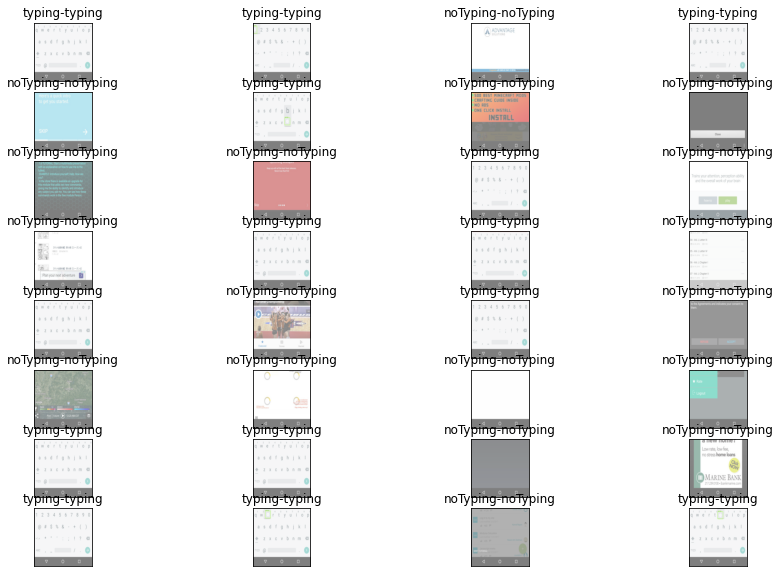

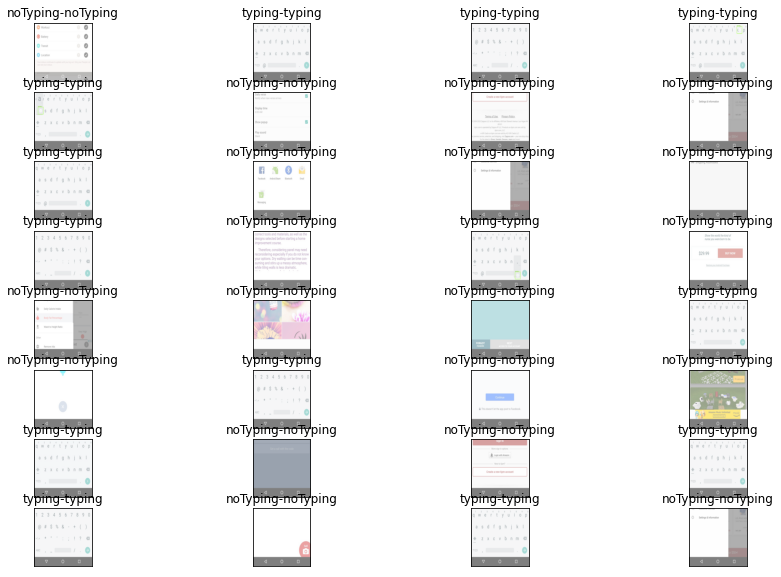

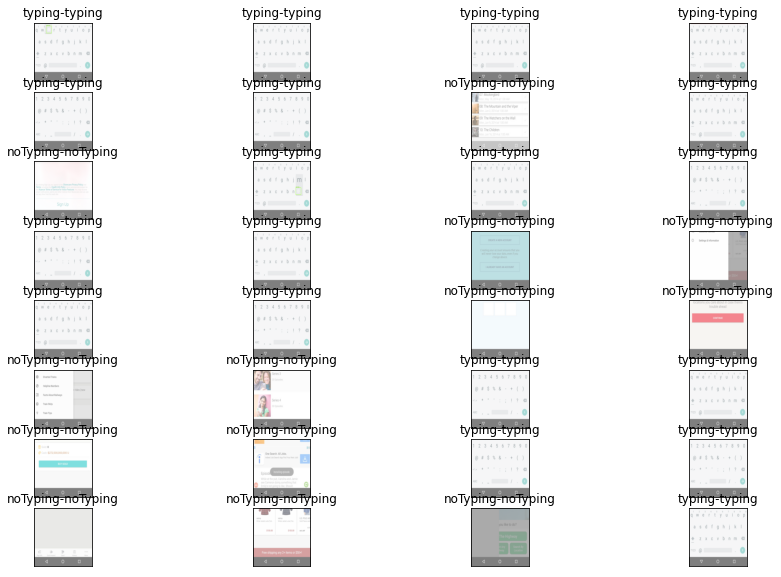

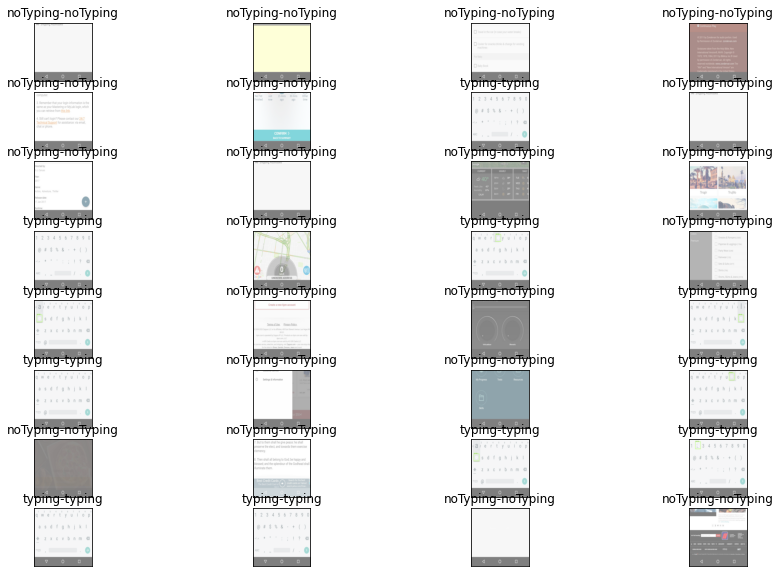

In [18]:
if __name__ == '__main__':
    main()

In [ ]:
# import matplotlib.pyplot as plt
# %matplotlib inline

# # helper function to un-normalize and display an image
# def imshow(img):
#     img = img / 2 + 0.5  # unnormalize
#     plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image
    
# # obtain one batch of training images
# dataiter = iter(output)
# images, labels = dataiter.next()
# images = images.numpy() # convert images to numpy for display

# # plot the images in the batch, along with the corresponding labels
# fig = plt.figure(figsize=(10, 4))
# # display 20 images
# for idx in np.arange(10):
#     ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
#     imshow(images[idx])
#     ax.set_title(classes[labels[idx]])

# print(correct)
# print(type(correct))
# print(class_correct)